In [47]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [1]:
import pandas as pd
import numpy as np 

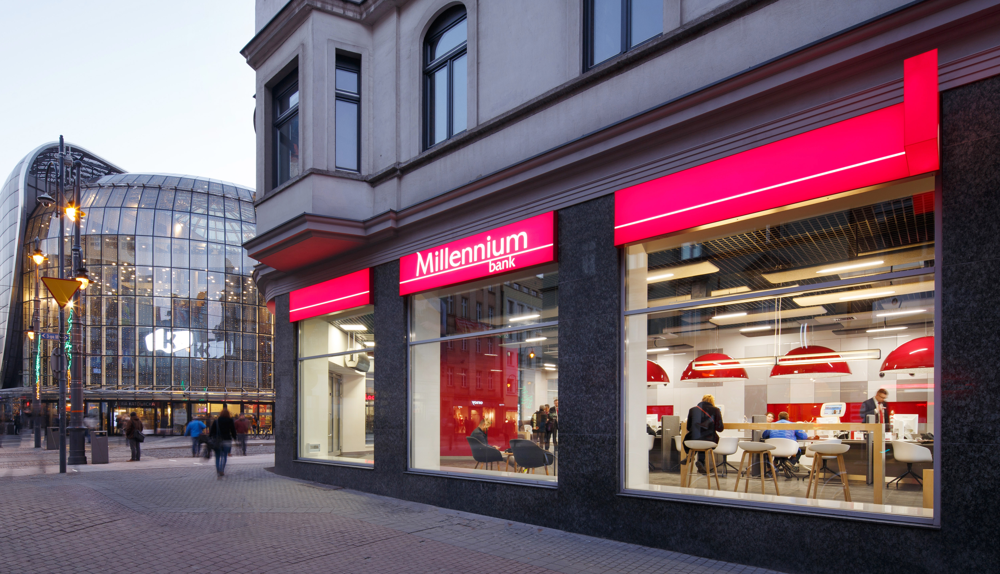


# Bank Marketing 

## Problem Statement 

The data is related with **direct marketing campaigns** of a Portuguese banking institution. 

The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed. 

**To analyze based on different data points , whether the client would subscribe to Bank term to deposit** 

In [2]:
df = pd.read_csv('C:/Users/shrey/Downloads/bank-additional/bank-additional-full.csv',sep = ';')

## Dataset Description 

### Attribute Information 

**bank data**

1 - age (numeric)

2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')

3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)

4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')

5 - default: has credit in default? (categorical: 'no','yes','unknown')

6 - housing: has housing loan? (categorical: 'no','yes','unknown')

7 - loan: has personal loan? (categorical: 'no','yes','unknown')

**related with the last contact of the current campaign:**

8 - contact: contact communication type (categorical: 'cellular','telephone') 

9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

**other attributes:**

12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

14 - previous: number of contacts performed before this campaign and for this client (numeric)

15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

**social and economic context attributes**

16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)

17 - cons.price.idx: consumer price index - monthly indicator (numeric) 

18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric) 

19 - euribor3m: euribor 3 month rate - daily indicator (numeric)

20 - nr.employed: number of employees - quarterly indicator (numeric)  

**Output variable (desired target):** 

21 - y - has the client subscribed a term deposit? (binary: 'yes','no')

### Dataset size 

In [3]:
df.shape

(41188, 21)

Our dataset contains 41,188 records and 21 attributes. 

### Dataset Sample 

Here's how our dataset looks like 

In [4]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


## Univariate Analysis 

We look at the statistical summary of all the variables present in our dataset

In [5]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,41188,NaN,NaN,NaN,40.0241,10.4212,17,32,38,47,98
job,41188,12,admin.,10422,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,41188,4,married,24928,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,41188,8,university.degree,12168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,41188,3,no,32588,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,41188,3,yes,21576,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,41188,3,no,33950,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,41188,2,cellular,26144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,41188,10,may,13769,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day_of_week,41188,5,thu,8623,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We observe the following :- 

1. Age has a range between 17 years and 98 years. With an average age of ~40. 

2. There are people with 12 different types of job inour dataset with "admin" being the predominant category. This could be due to the fact that admin usually handles the company banking relatede matters.

3. Most of our customers have a university degree. 

4. Most of our targeted users do not have a default. 

5. Most of our targetd users have a housing loan however we can also see that most of our targets do not have a personal loan. 

In [6]:
import plotly.express as px

### Age : 

Here we look at the age distribution of the targeted users. 

In [7]:
df[['age']].describe().T

,count,mean,std,min,25%,50%,75%,max
age,41188.0,40.02406,10.42125,17.0,32.0,38.0,47.0,98.0


In [8]:
px.histogram(df , x = 'age')

We can see that age is **right skewed** and the average value of age from our targeted user is 40. 

We can also observe most of our users are **between the age 30 and 40.** 

### Job 

We have 12 types of jobs. With admin being the repeated the maximum times

In [9]:
df[['job']].describe().T

,count,unique,top,freq
job,41188,12,admin.,10422


In [10]:
px.histogram(df , x = 'job')

We can observer that most of our targeted users are either admin or blue-collar workers. 

We've also observed targeting retired , unemployed and students , We would study the conversion rate.  


### Marital Status 

We look at the distribution of Marital status 

In [11]:
df[['marital']].describe().T

,count,unique,top,freq
marital,41188,4,married,24928


In [12]:
px.histogram(df , x = 'marital')

Most of our targeted users are either Married or Single. 

### Education 

We look at the distribution of education among our targeted users. 

In [14]:
df[['education']].describe().T

,count,unique,top,freq
education,41188,8,university.degree,12168


In [15]:
px.histogram(df , x = 'education')

Most of our targeted users are either University degree holders or either High school degree holders. This also can represent the fact that we've many targeted users as Blue-collar workers. 

We can also see Illitrate in our dataset. However there are only 18 such targeted users. 

### Default , Housing Loan , Personal Loans 

Here we look whether our targeted users are defaulters , or have a personal/housing loan. 

In [17]:
df[['default','housing','loan']].describe().T

,count,unique,top,freq
default,41188,3,no,32588
housing,41188,3,yes,21576
loan,41188,3,no,33950


#### Default

In [18]:
px.histogram(df , x='default')

#### Housing Loan

In [19]:
px.histogram(df , x='housing')

#### Personal Loan

In [20]:
px.histogram(df , x='loan')

We can see most of the people do not have a personal loan and Housing loan. We're also observing the most of our targeted customers are not defaulters

## Data Preprocessing 

We create dummies for the following variables :- 

1. Marital 
2. Job 
3. Education 
4. Poutcome (Previous outcome) 

In [29]:
df1 = pd.get_dummies(df , columns=['marital','job','education','poutcome'])

In [30]:
df1.head()

,age,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,...,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,education_unknown,poutcome_failure,poutcome_nonexistent,poutcome_success
0,56,no,no,no,telephone,may,mon,261,1,999,...,0,0,0,0,0,0,0,0,1,0
1,57,unknown,no,no,telephone,may,mon,149,1,999,...,0,0,1,0,0,0,0,0,1,0
2,37,no,yes,no,telephone,may,mon,226,1,999,...,0,0,1,0,0,0,0,0,1,0
3,40,no,no,no,telephone,may,mon,151,1,999,...,1,0,0,0,0,0,0,0,1,0
4,56,no,no,yes,telephone,may,mon,307,1,999,...,0,0,1,0,0,0,0,0,1,0


For other variables such as :- 
1. Default : if default then 1 else 0 
2. Housing : if housing loan then 1 else 0 
3. Loan : if personal loan then 1 else 0 
3. Contact :if cellular then 1 else 0 

We would create them manually based on our understanding

In [31]:
df1['default'] = np.where(df1['default'] == 'yes', 1, 0)
df1['housing'] = np.where(df1['housing'] == 'yes', 1, 0)
df1['loan'] = np.where(df1['loan'] == 'yes', 1, 0)
df1['contact'] = np.where(df1['contact'] == 'cellular', 1, 0)

In [32]:
df1.head()

,age,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,...,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,education_unknown,poutcome_failure,poutcome_nonexistent,poutcome_success
0,56,0,0,0,0,may,mon,261,1,999,...,0,0,0,0,0,0,0,0,1,0
1,57,0,0,0,0,may,mon,149,1,999,...,0,0,1,0,0,0,0,0,1,0
2,37,0,1,0,0,may,mon,226,1,999,...,0,0,1,0,0,0,0,0,1,0
3,40,0,0,0,0,may,mon,151,1,999,...,1,0,0,0,0,0,0,0,1,0
4,56,0,0,1,0,may,mon,307,1,999,...,0,0,1,0,0,0,0,0,1,0


In [41]:
df1['y'] = np.where(df1['y'] == 'yes',1 , 0)

In [34]:
import seaborn as sns

## Bivariate analysis 

We look at the dataset from two variable perspective. 

First , we look at correlations

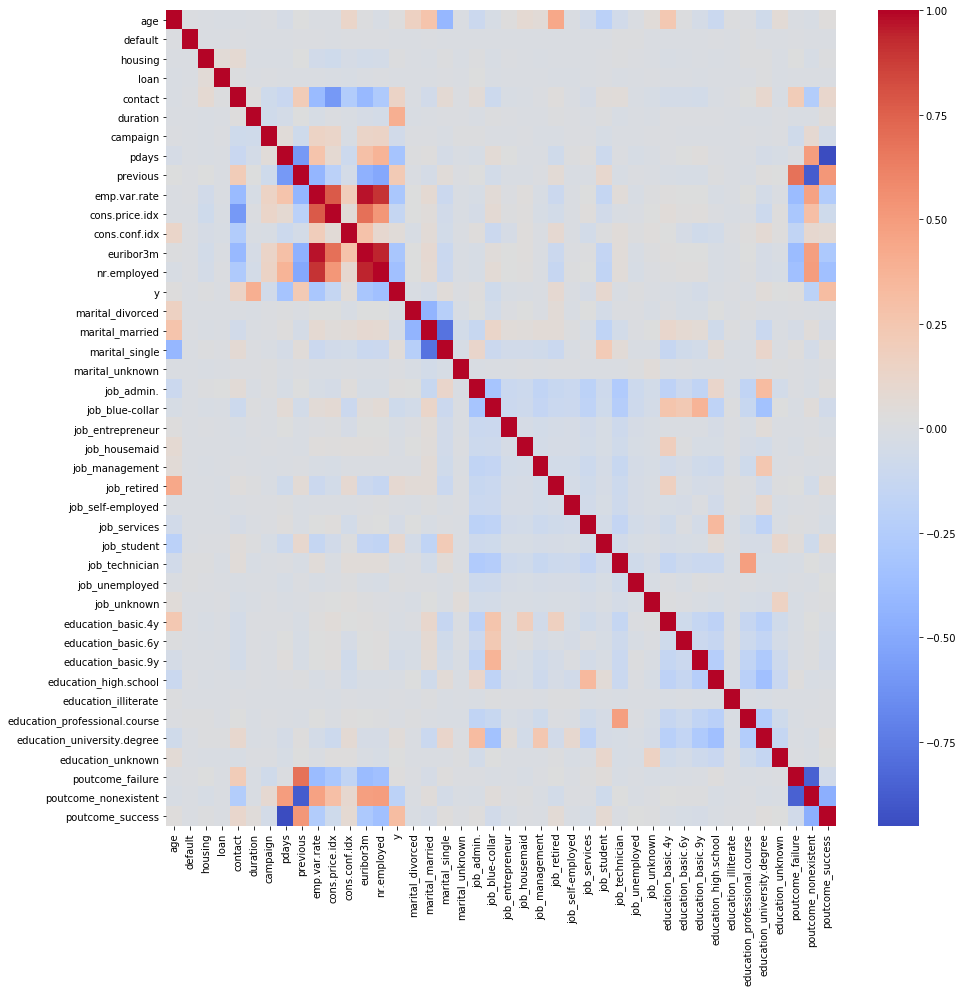

In [42]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (15,15))
sns.heatmap(df1.corr(),cmap='coolwarm')

### Relationship between age and outcome

In [46]:
px.bar(df1 , x = 'y', y='age')